# Setup

In [1]:
!pwd

/home/umni2/a/umnilab/users/verma99/mk/home_detection/code


In [2]:
from setup import *

# Load data

## Regions

In [3]:
indy = Region.load('Indianapolis', 'Indiana')
indy.dates = U.dates('2021-03-01', '2021-03-07')

In [4]:
aus = Region.load('Austin', 'Texas')
aus.dates = U.dates('2021-07-01', '2021-07-07')

In [5]:
hous = Region.load('Houston', 'Texas')
hous.dates = U.dates('2021-07-01', '2021-07-07')

### Regional boundaries

In [6]:
def load_boundary(rgn):
    return gpd.read_file(MK / f'general/data/cities/{rgn}/boundary.gpkg')

indy.boundary = load_boundary(indy)
aus.boundary = load_boundary(aus)
hous.boundary = load_boundary(hous)

## Home locations

In [7]:
rgns = [aus, hous, indy]
algos = ['A0', 'A1', 'A2', 'A3']
algo_colors = sns.color_palette('Set1', len(algos))

### Overall

In [9]:
summary = []
for rgn in [indy, aus, hous]:
    for method in ['SM', 'ZL_old', 'ZL_new']:
        df = pd.read_parquet(P.data + f'home_locs/{rgn.name}_{method}.parquet')
        df = df.rename(columns={'lon2': 'lon', 'lat2': 'lat'})
        setattr(rgn, 'homes_' + method, df)
        summary.append(dict(method=method, city=rgn.name, n_users=df.shape[0]))
Pdf(summary)

,method,city,n_users
0,SM,Indianapolis,89810
1,ZL_old,Indianapolis,75058
2,ZL_new,Indianapolis,75475
3,SM,Austin,92589
4,ZL_old,Austin,64848
5,ZL_new,Austin,66910
6,SM,Houston,286965
7,ZL_old,Houston,216516
8,ZL_new,Houston,210560


In [11]:
summary = []
for rgn, alg in it.product(rgns, algos):
    try:
        df = pd.read_parquet(rgn.data / f'home_locs/{alg}.parquet')
        if alg == 'A3': df = df.query('~used_mean').drop(columns='used_mean')
        setattr(rgn, alg, df)
        summary.append(dict(algorithm=alg, city=rgn.name, n_users=len(df)))
    except FileNotFoundError:
        pass
Pdf(summary).pivot(index='city', columns='algorithm', values='n_users')

algorithm,A0,A1,A2,A3
city,,,,
Austin,44005,44005,44005,74019
Houston,147651,147651,147651,250220
Indianapolis,63295,63295,63295,48154


### Within city limit

In [12]:
%%time
# t=7s
res = []
for rgn, alg in it.product(rgns, algos):
    boundary = rgn.boundary.to_crs(CRS_M)
    df = mk.geo.pdf2gdf(getattr(rgn, alg).copy(), LON, LAT, CRS_DEG).to_crs(CRS_M)
    setattr(rgn, 'homes_' + alg, df)
    n = gpd.sjoin(df, boundary, predicate='within').shape[0]
    res.append(dict(city=rgn.name, algorithm=alg, n_users=n))
Pdf(res).pivot(index='city', columns='algorithm', values='n_users')

CPU times: user 3.38 s, sys: 159 ms, total: 3.54 s
Wall time: 3.55 s


algorithm,A0,A1,A2,A3
city,,,,
Austin,16267,16079,16045,29839
Houston,51879,49809,49957,92590
Indianapolis,23167,21810,21761,20364


### Common users data

In [13]:
def get_common_users_home_locs(rgn, algos=algos):
    res = []
    for alg in algos:
        df = getattr(rgn, alg).set_index(UID)[[LON, LAT]]
        res.append(df.rename(columns=lambda x: alg + '_' + x))
    res = pd.concat(res, axis=1).dropna()
    return res

In [14]:
aus.commons = get_common_users_home_locs(aus).disp()
indy.commons = get_common_users_home_locs(indy); print(len(indy.commons))
hous.commons = get_common_users_home_locs(hous); print(len(hous.commons))

32,825 rows x 8 cols; Memory: 2.0 MiB


,A0_lon,A0_lat,A1_lon,A1_lat,A2_lon,A2_lat,A3_lon,A3_lat
uid,<float32>,<float32>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>
-9212849915395774532,-97.703346,30.517958,-97.709,30.518448,-97.708748,30.518347,-97.709099,30.518415


28658
112646


# M1: Land use performance metric

## Load the buffers

In [14]:
def get_resi_buffers(rgn, cmap='rainbow_r'):
    R = pd.concat([
        gpd.read_file(f).assign(buffer = int(f.split('/')[-1].split('.')[0]))
        for f in tqdm(sorted(glob(P.data + f'geometry/{rgn.name}/residential/*.gpkg')))
    ]).set_index('buffer').sort_index()
    R = gpd.clip(R.to_crs(CRS_DEG), rgn.boundary)
    R['color'] = list(sns.color_palette(cmap, len(R)).as_hex())
    R.loc[0, 'color'] = '#000000'
    return R

In [15]:
%time indy.R = get_resi_buffers(indy) # t=23s
indy.R.drop(columns='geometry').disp(2); pass

  0%|          | 0/27 [00:00<?, ?it/s]

CPU times: user 12.9 s, sys: 1.37 s, total: 14.2 s
Wall time: 17 s
27 rows x 1 cols; Memory: 0.0 MiB


,color
buffer,<object>
1000,#ff1c0e
950,#ff381c


In [16]:
%time aus.R = get_resi_buffers(aus) # t=20s
# aus.R.drop(columns='geometry').disp(2); pass

  0%|          | 0/27 [00:00<?, ?it/s]

CPU times: user 13.2 s, sys: 1.17 s, total: 14.4 s
Wall time: 16.9 s


In [17]:
%time hous.R = get_resi_buffers(hous) # t=53s
# hous.R.drop(columns='geometry').disp(2); pass

  0%|          | 0/17 [00:00<?, ?it/s]

CPU times: user 45.8 s, sys: 4.52 s, total: 50.3 s
Wall time: 50.7 s


## Compute performance

In [22]:
def get_lu_detection_rate(homes, rgn):
    homes = mk.geo.pdf2gdf(homes.copy(), LON, LAT, CRS_DEG).set_index(UID)
    homes = (gpd.sjoin(homes, rgn.boundary[['geometry']], predicate='within')
             .drop(columns='index_right'))
    n_homes = homes.shape[0]
    res = {}
    for buffer, row in rgn.R.sort_index().iterrows():
        within = gpd.sjoin(homes, Gdf({'geometry': [row.geometry]}, crs=CRS_DEG), predicate='within')
        res[buffer] = within.shape[0]
        homes = homes.loc[list(set(homes.index) - set(within.index))]
    res = Seq(res, name='n_homes').rename_axis('buffer').cumsum().reset_index()
    res['det_rate'] = 100 * res['n_homes'] / n_homes
    return res
    
# %time x = get_lu_detection_rate(indy.homes_ZL_new, indy).disp()

## Visualize

In [20]:
def plot_lu_detection_rate(rgn, algos=algos, size=(8, 4.5), dpi=120, cmap='husl'):
    ax = U.plot(size=size, dpi=dpi, ylab='Detection rate (%)', framebordercolor='k',
                title='Comparison of residential detection rates for ' + rgn.name)
    for alg, color in zip(algos, algo_colors):
        homes = getattr(rgn, 'homes_' + alg)
        df = get_lu_detection_rate(rgn, alg).set_index('buffer')
        n_homes = int(df.iloc[0]['n_homes'] / (df.iloc[0]['det_rate'] / 100))
        performance = ((df['det_rate'] * (df.index.max() - df.index)).sum() / 
                       (df['det_rate'].sum() * df.index.max()))
        label = '$\mathbf{%s}$\n($N=$%d, $\mu=$%0.1f%%)' % (alg, n_homes, performance)
        df['det_rate'].plot(ax=ax, color=color, marker='.', label=label)
    (((rgn.R.to_crs(CRS_M).area / rgn.boundary.to_crs(CRS_M).area.iloc[0]).sort_index() * 100)
     .plot(ax=ax, marker='|', color='k', ls='--', lw=2, label='% total area in buffer'))
    ax.set_xlabel('Buffer width (m)')
    ax.legend(title='Home location set')
    P.imsave(ax=ax)

In [33]:
def plot_lu_detection_rate_all(rgns=rgns, algos=algos, colors=algo_colors,
                               filt_commons=False, max_buffer=np.inf,
                               size=(10, 3.5), dpi=200, cmap='gnuplot_r'):
    fig, axs = plt.subplots(1, len(rgns), figsize=size, dpi=dpi, sharey=True)
    for rgn, ax in tqdm(list(zip(rgns, axs))):
        ax = U.plot(ax, framebordercolor='k', title=rgn.name,
                    ylab=r'Detection rate, $\rho$'+'\n(% of homes inside buffer)')
        for alg, color in zip(algos, colors):
            # homes = getattr(rgn, 'homes_'+alg)
            df = get_lu_detection_rate(rgn, alg, max_buffer).set_index('buffer')
            n_homes = int(df.iloc[0]['n_homes'] / (df.iloc[0]['det_rate'] / 100))
            performance = ((df['det_rate'] * (df.index.max() - df.index)).sum() / 
                           (df['det_rate'].sum() * df.index.max()))
            label = '$\mathbf{%s}$ ($n$=%d, $m_1$=%0.2f)' % (
                f'{alg[0]}_{alg[1]}', n_homes, performance)
            df['det_rate'].plot(ax=ax, color=color, marker='.', label=label)
        resi = rgn.R[rgn.R.index <= max_buffer] if max_buffer else rgn.R
        buffer_area = ((resi.to_crs(CRS_M).area / rgn.boundary.to_crs(CRS_M).area.iloc[0])
                       .sort_index() * 100)
        buffer_area.plot(ax=ax, marker='|', color='k', ls='--', 
                         lw=2, label='% total area in buffer')
        ax.set_xlabel(r'Buffer width, $r$ (m)')
        ax.legend()
    plt.tight_layout()
    P.imsave('Comparison of M1 for different HDAs')

  0%|          | 0/3 [00:00<?, ?it/s]

CPU times: user 37.9 s, sys: 1.71 s, total: 39.6 s
Wall time: 39 s


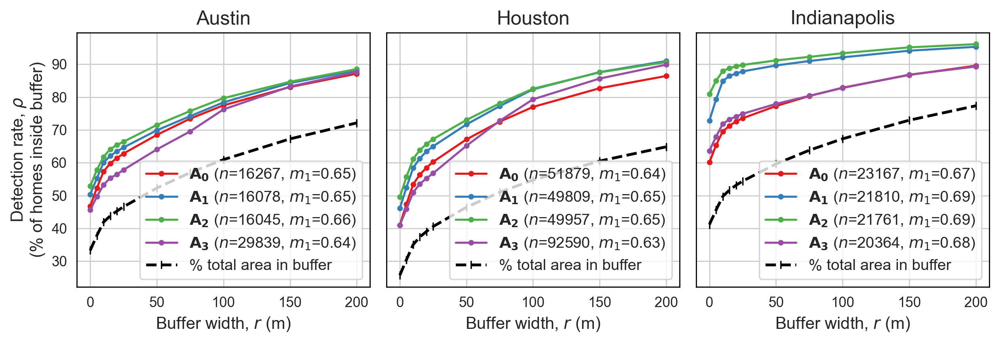

In [34]:
%time plot_lu_detection_rate_all(max_buffer=200, dpi=250) # t=38s

# M2: Proximity metric

## Compute daily min distances

In [23]:
SP.start()

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


23/04/01 15:23:13 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [24]:
def dist_deg2m(angle, lat, a=6_371_001, b=6_356_752):
    """ Convert angular distance from degrees to meters at given latitude. """
    lat = np.deg2rad(lat)
    curve_radius = (a * b) ** 2 / (
        (a * np.cos(lat)) ** 2 + (b * np.sin(lat)) ** 2) ** 1.5
    return float(curve_radius * np.deg2rad(angle))

In [25]:
def get_proximity(rgn, alg):
    homes = (SP.read_parquet(rgn.data / f'home_locs/{alg}.parquet')
             .select(UID, *[F.col(x).cast(T.float).alias('home_'+x) for x in [LON, LAT]]))
    df = SP.read_parquet(rgn.data / 'night_pings')
    df = df.join(homes, on=UID)
    def dist4home(x, y, homex, homey):
        d = np.min(((Arr(x) - homex)**2 + (Arr(y) - homey)**2)**0.5)
        return dist_deg2m(d, homey)
    df = df.withColumn('n_pings', F.size(LON).cast(T.int16))
    df = df.withColumn('dist', F.udf(dist4home, T.float)(LON, LAT, 'home_'+LON, 'home_'+LAT))
    df = df.select(UID, 'day', 'n_pings', 'dist')
    return df
    
get_proximity(indy, 'A1')

DataFrame[uid: bigint, day: smallint, n_pings: smallint, dist: float]

In [26]:
%%time
# t=26s
for rgn in tqdm(rgns):
    rgn.traj_proxi = {alg: get_proximity(rgn, alg).toPandas()
                      for alg in algos}

  0%|          | 0/3 [00:00<?, ?it/s]

CPU times: user 614 ms, sys: 362 ms, total: 976 ms
Wall time: 38.4 s


In [27]:
indy.traj_proxi['A1']

,uid,day,n_pings,dist
0,-9219177883694077236,1,100,34.746140
1,-9219177883694077236,2,32,35.572330
2,-9219177883694077236,3,23,35.572330
3,-9219177883694077236,4,34,35.572330
4,-9219177883694077236,5,36,35.572330
...,...,...,...,...
489288,9212009442213703494,3,123,16.873857
489289,9212009442213703494,4,138,16.140684
489290,9212009442213703494,5,141,30.490427
489291,9212009442213703494,6,193,30.490427


## Visualize

In [28]:
def plot_traj_proximity_hist(rgn, algos=algos, common_axes=True,
                             cum=True, vmax=60, bins=100,
                             size=(10, 2.5), dpi=120):
    fig, axs = plt.subplots(1, len(algos), figsize=size, dpi=dpi, 
                            sharex=common_axes, sharey=common_axes)
    agg_fns, colors = list(zip(*[(np.mean, 'blue'), (np.median, 'red')]))
    for i, (alg, ax) in enumerate(list(zip(algos, axs))):
        df = rgn.traj_proxi[alg].groupby(UID).agg({'dist': agg_fns})
        print(f'{alg}: nUsers={df.shape[0]:,}')
        ax = U.plot(ax, ylog=1, xeng=1, title=f'{rgn.name}: {alg}',
                    ylab='No. of users' if i == 0 else '',
                    xlab='Min distance from home (km)', framebordercolor='grey')
        for func, color in zip(agg_fns, colors):
            label = func.__name__
            dist_km = (df['dist'][label] / 1000)
            dist_km.clip(0, vmax).hist(
                bins=bins, ax=ax, color=color, alpha=0.8,
                histtype='step', lw=1.25, label=label.title())
        ax.set_yticks([10**x for x in range(1, 6)])
        if i == 0: ax.legend()
    plt.tight_layout()
    P.imsave(f'Proximity {"CDF" if cum else "PDF"} - {rgn.name}')
    
# %time plot_traj_proximity_hist(indy)

A0: nUsers=63,295
A1: nUsers=63,295
A2: nUsers=63,295
A3: nUsers=42,795


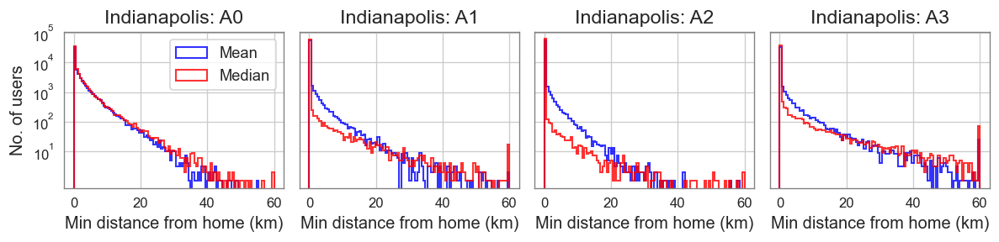

In [29]:
plot_traj_proximity_hist(indy)

### Figure

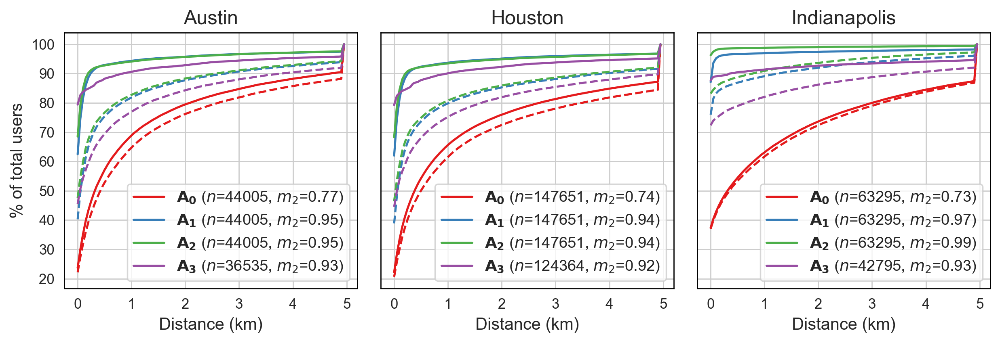

In [36]:
def plot_fig_traj_proxi_hist(rgns=rgns, algos=algos, colors=algo_colors,
                             vmax=5, bins=100, cum=True,
                             size=(10, 3.5), dpi=200):
    fig, axes = plt.subplots(1, len(rgns), figsize=size, dpi=dpi, sharey=True)
    for i, (rgn, ax) in enumerate(list(zip(rgns, axes))):
        for alg, color in zip(algos, algo_colors):
            for j, (agg_fn, ls) in enumerate([(np.median, '-'), (np.mean, '--')]):
                df = rgn.traj_proxi[alg].groupby(UID)['dist'].agg(agg_fn)
                y, x = np.histogram((df.values / 1000).clip(0, vmax), bins=bins)
                y = (y.cumsum() if cum else y) / y.sum() * 100
                m2 = y.sum() / (100 * len(y))
                label = '$\mathbf{%s}$ ($n$=%d, $m_2$=%0.2f)' % (
                    f'{alg[0]}_{alg[1]}', len(df), m2)
                ax.plot(x[:-1], y, color=color, ls=ls, label=label if j == 0 else None)
        ax = U.plot(ax, title=rgn.name, xlab='Distance (km)', framebordercolor='k',
                    ylab='% of total users' if i == 0 else '')
        ax.legend()
    plt.tight_layout()
    P.imsave('Comparison of M2 for different HDAs')
    
plot_fig_traj_proxi_hist(dpi=250)

# M3: Trip-based

## Extract stay regions

# Miscellaneous

## Home locations

In [9]:
summary = []
for rgn in [indy, aus, hous]:
    for method in ['SM', 'ZL_old', 'ZL_new']:
        df = pd.read_parquet(P.data + f'home_locs/{rgn.name}_{method}.parquet')
        df = df.rename(columns={'lon2': 'lon', 'lat2': 'lat'})
        setattr(rgn, 'homes_' + method, df)
        summary.append(dict(method=method, city=rgn.name, n_users=df.shape[0]))
Pdf(summary)

,method,city,n_users
0,SM,Indianapolis,89810
1,ZL_old,Indianapolis,75058
2,ZL_new,Indianapolis,75475
3,SM,Austin,92589
4,ZL_old,Austin,64848
5,ZL_new,Austin,66910
6,SM,Houston,286965
7,ZL_old,Houston,216516
8,ZL_new,Houston,210560


# Land use performance metric

## Prepare land use maps

### Base residential area

In [10]:
def get_residential(rgn, save=True):
    # land use layer of the city as prepared in the `General` project
    lu = gpd.read_file(MK + f'General/data/cities/{rgn.name.lower()}/land_use.gpkg')
    # residential regions as defined as category "O" (origin)
    resi = Gdf({'geometry': [(lu[lu['dmd_kind'].isin(['O', 'OD'])]
                              .geometry.unary_union)]}, crs=CRS_DEG)
    if save:
        outpath = U.mkdir(P.data + f'geometry/{rgn.name}/residential/')
        resi.to_file(outpath + '0.gpkg')
    return resi

In [11]:
def load_r0(rgn):
    setattr(rgn, 'r0', gpd.read_file(P.data + f'geometry/{rgn.name}/residential/0.gpkg'))

### Prepare buffers around residential area

In [12]:
def save_resi_buffers(rgn, buffers):
    for buf in tqdm(buffers):
        df = rgn.r0.to_crs(CRS_M).buffer(buf).to_crs(CRS_DEG)
        df.to_file(U.mkdir(P.data + f'geometry/{rgn.name}/residential/') + f'{buf}.gpkg')

In [13]:
buffers = [5, 10, 15, 20, 25, 50, 75, 100, 150, 200, 250, 300, 350, 400, 450, 500, 550, 600, 650, 700, 750, 800, 850, 900, 950, 1000]

### Visualize the buffers

In [14]:
def get_resi_buffers(rgn, cmap='rainbow_r'):
    R = pd.concat([
        gpd.read_file(f).assign(buffer = int(f.split('/')[-1].split('.')[0]))
        for f in tqdm(sorted(glob(P.data + f'geometry/{rgn.name}/residential/*.gpkg')))
    ]).set_index('buffer').sort_index()
    R = gpd.clip(R.to_crs(CRS_DEG), rgn.boundary)
    R['color'] = list(sns.color_palette(cmap, len(R)).as_hex())
    R.loc[0, 'color'] = '#000000'
    return R

In [15]:
%time indy.R = get_resi_buffers(indy) # t=23s
indy.R.drop(columns='geometry').disp(2); pass

  0%|          | 0/27 [00:00<?, ?it/s]

CPU times: user 12.9 s, sys: 1.37 s, total: 14.2 s
Wall time: 17 s
27 rows x 1 cols; Memory: 0.0 MiB


,color
buffer,<object>
1000,#ff1c0e
950,#ff381c


In [16]:
%time aus.R = get_resi_buffers(aus) # t=20s
# aus.R.drop(columns='geometry').disp(2); pass

  0%|          | 0/27 [00:00<?, ?it/s]

CPU times: user 13.2 s, sys: 1.17 s, total: 14.4 s
Wall time: 16.9 s


In [17]:
%time hous.R = get_resi_buffers(hous) # t=53s
# hous.R.drop(columns='geometry').disp(2); pass

  0%|          | 0/17 [00:00<?, ?it/s]

CPU times: user 45.8 s, sys: 4.52 s, total: 50.3 s
Wall time: 50.7 s


In [18]:
def plot_resi_buffers(rgn, resi=None, size=(30, 30)):
    R = resi or getattr(rgn, 'R')
    ax = U.plot(size=size)
    R.to_crs(CRS_M).sort_index(ascending=False).plot(ax=ax, color=R['color'], edgecolor='none')
    ax.legend(handles=[
        mpl.patches.Patch(color=color, label=str(buf)) for buf, color in 
        R['color'].sort_index().to_dict().items()],
              title='Buffer width (m)', loc='upper right', fontsize=20)
    rgn.boundary.to_crs(CRS_M).plot(ax=ax, facecolor='none', edgecolor='r', linewidth=5)
    P.imsave('Land use buffers in ' + rgn.name)

CPU times: user 16.8 s, sys: 576 ms, total: 17.4 s
Wall time: 17 s


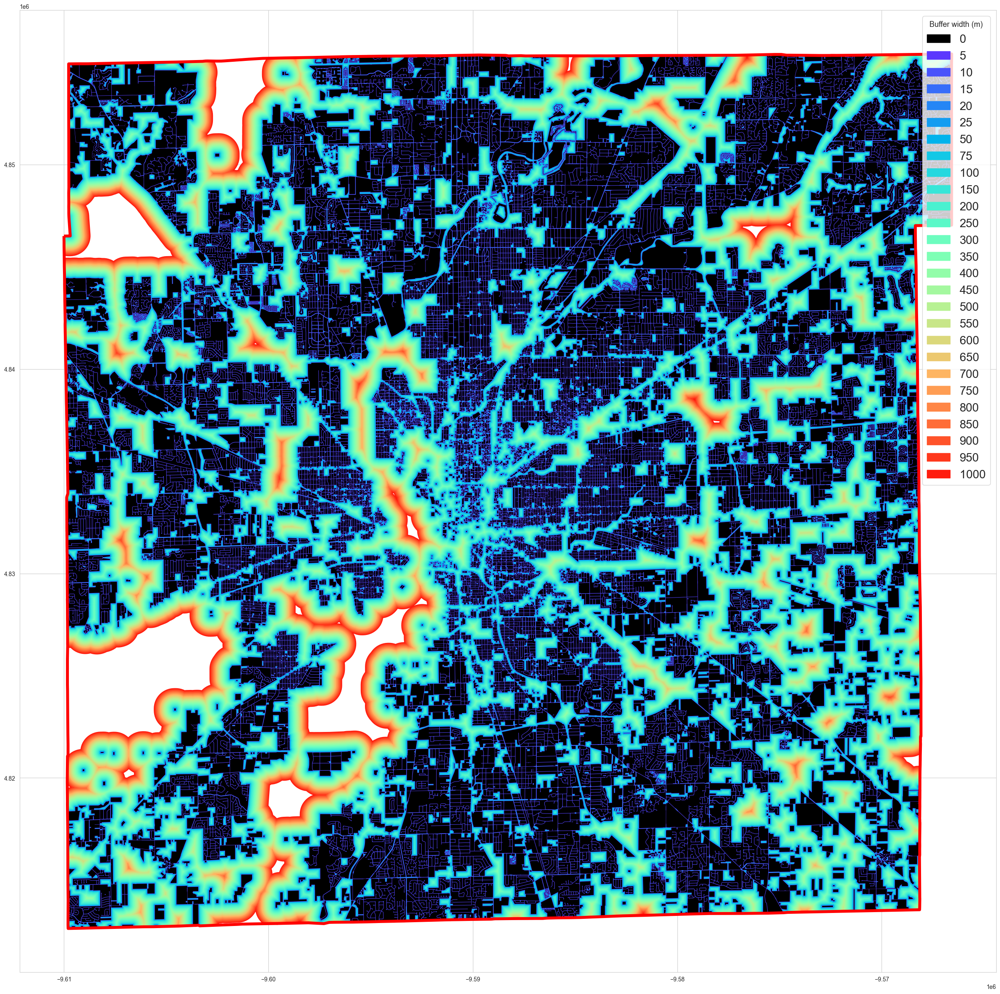

In [19]:
%time plot_resi_buffers(indy) # t=25s

CPU times: user 11 s, sys: 465 ms, total: 11.5 s
Wall time: 11.1 s


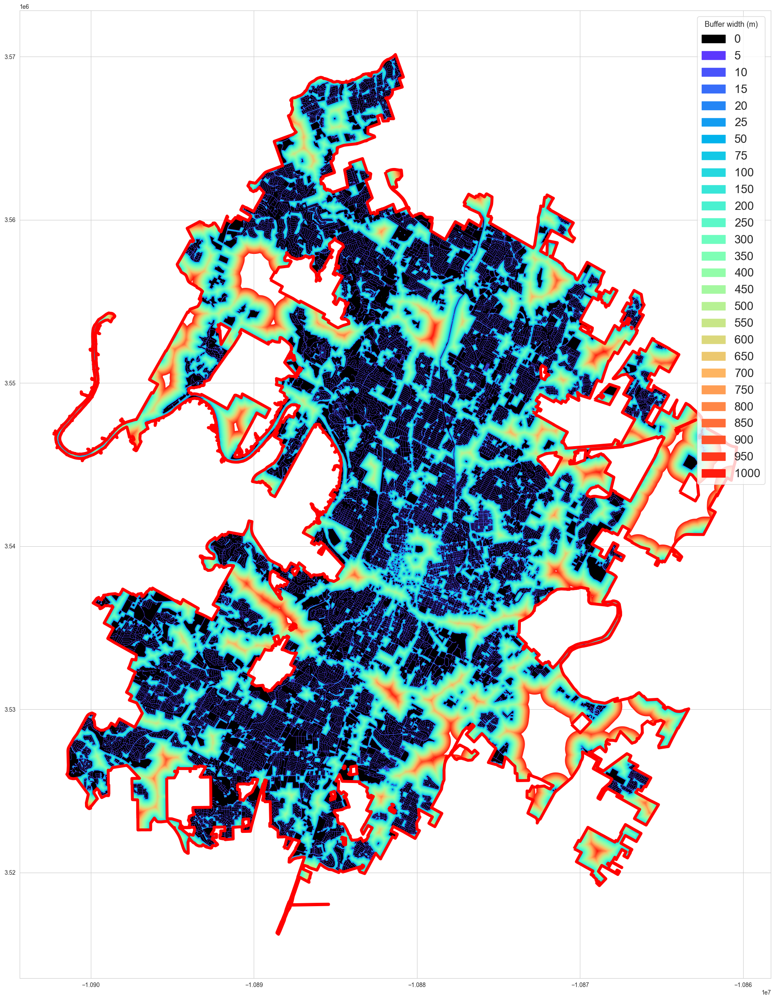

In [20]:
%time plot_resi_buffers(aus) # t=18s

CPU times: user 23.9 s, sys: 783 ms, total: 24.7 s
Wall time: 24.4 s


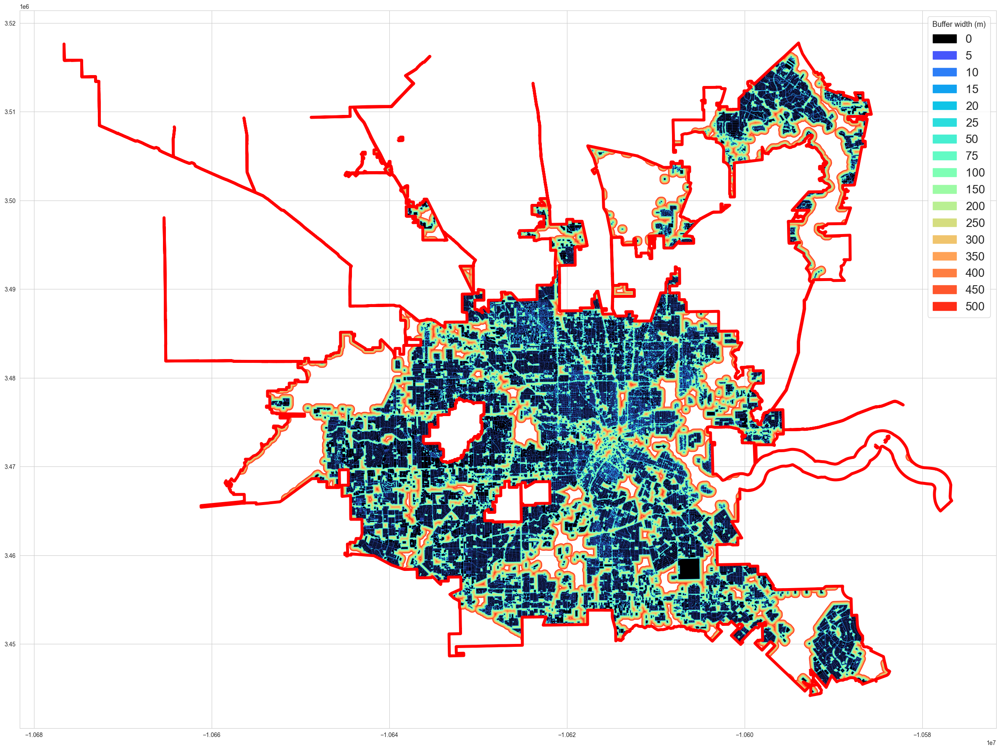

In [21]:
%time plot_resi_buffers(hous) # t=18s

## Compute performance

In [22]:
def get_lu_detection_rate(homes, rgn):
    homes = mk.geo.pdf2gdf(homes.copy(), LON, LAT, CRS_DEG).set_index(UID)
    homes = (gpd.sjoin(homes, rgn.boundary[['geometry']], predicate='within')
             .drop(columns='index_right'))
    n_homes = homes.shape[0]
    res = {}
    for buffer, row in rgn.R.sort_index().iterrows():
        within = gpd.sjoin(homes, Gdf({'geometry': [row.geometry]}, crs=CRS_DEG), predicate='within')
        res[buffer] = within.shape[0]
        homes = homes.loc[list(set(homes.index) - set(within.index))]
    res = Seq(res, name='n_homes').rename_axis('buffer').cumsum().reset_index()
    res['det_rate'] = 100 * res['n_homes'] / n_homes
    return res
    
# %time x = get_lu_detection_rate(indy.homes_ZL_new, indy).disp()

In [23]:
def plot_lu_detection_rate(rgn, methods, size=(8, 4.5), dpi=120, cmap='husl'):
    ax = U.plot(size=size, dpi=dpi, ylab='Detection rate (%)', framebordercolor='k',
                title='\n'.join(['Comparison of detection rates for',
                                 'different home location results for ' + rgn.name]))
    colors = sns.color_palette(cmap, len(methods))
    for method, color in zip(methods, colors):
        homes = getattr(rgn, 'homes_' + method)
        df = get_lu_detection_rate(homes, rgn).set_index('buffer')
        n_homes = int(df.iloc[0]['n_homes'] / (df.iloc[0]['det_rate'] / 100))
        performance = ((df['det_rate'] * (df.index.max() - df.index)).sum() / 
                       (df['det_rate'].sum() * df.index.max()))
        df['det_rate'].plot(ax=ax, color=color, marker='.',
                            label='{}\n($N=${:,},\n$\mu=${:.1%})'.format(
                                method, n_homes, performance))
    (((rgn.R.to_crs(CRS_M).area / rgn.boundary.to_crs(CRS_M).area.iloc[0]).sort_index() * 100)
     .plot(ax=ax, marker='|', color='k', ls='--', lw=2, label='% total area in buffer'))
    ax.set_xlabel('Buffer width (m)')
    ax.legend(title='Home location set')
    P.imsave(ax=ax)

CPU times: user 10.7 s, sys: 455 ms, total: 11.2 s
Wall time: 11 s


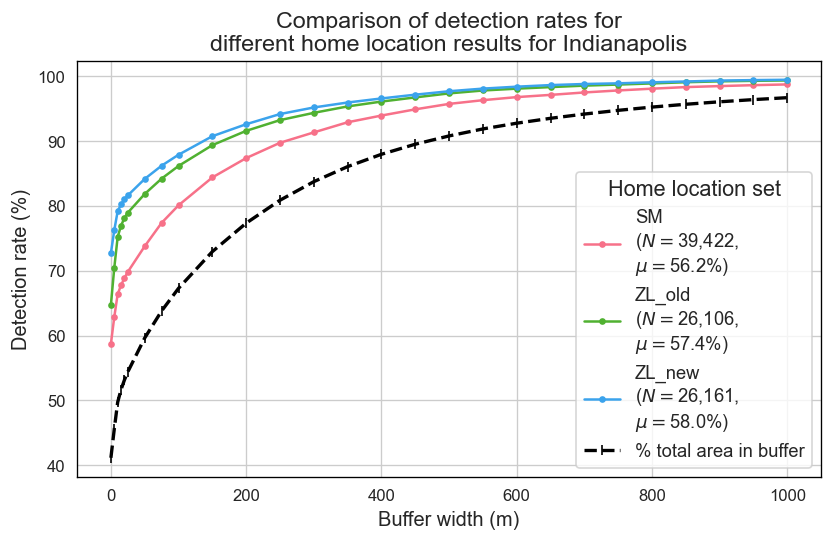

In [24]:
%time plot_lu_detection_rate(indy, ['SM', 'ZL_old', 'ZL_new']) # t=15s

CPU times: user 8.66 s, sys: 410 ms, total: 9.07 s
Wall time: 8.62 s


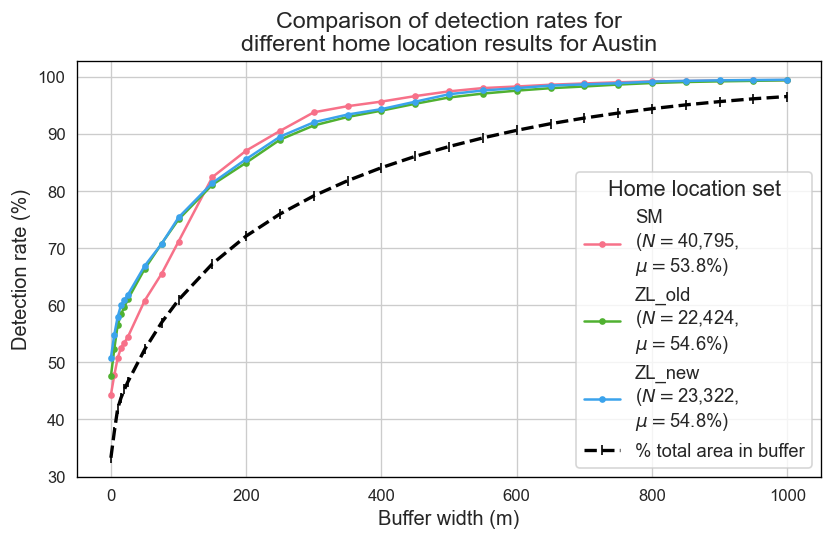

In [25]:
%time plot_lu_detection_rate(aus, ['SM', 'ZL_old', 'ZL_new']) # t=10s

CPU times: user 19.4 s, sys: 485 ms, total: 19.9 s
Wall time: 19.5 s


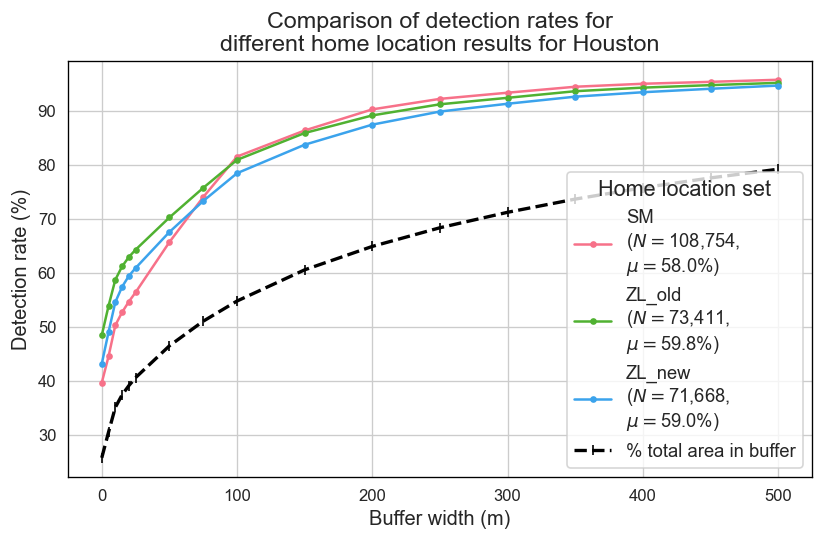

In [26]:
%time plot_lu_detection_rate(hous, ['SM', 'ZL_old', 'ZL_new']) # t=10s